# NBA player Stats Analysis 
## (Report attached in the repository)

## Required Libraries

In [5]:

# libraries
import random
import pandas as pd
import numpy as np
import seaborn as sns
import networkx as nx
import datetime
#python -m pip install fuzzywuzzy
#import fuzzywuzzy
#from fuzzywuzzy import process
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
import matplotlib.gridspec as gridspec
import warnings; warnings.filterwarnings("ignore")

In [6]:
# unhide all rows and columns
pd.set_option('display.max_rows', 50)
pd.set_option('display.max_columns', 50)
pd.set_option('display.width', 1000)

In [7]:
# for character encoding
import chardet

In [8]:
# for box-cox transformation
from scipy import stats


In [10]:
# for min_max scaling
#from mlxtend.preprocessing import minmax_scaling

## Importing Data

In [11]:
# load data
nba = "C:/Users/Donoo/Desktop/BANA advanced/NBA assignment 1/archive/2021-2022 NBA Player Stats - Regular.csv"
players = pd.read_csv(nba, delimiter=";", encoding="latin-1", index_col=0)
players.head(10)

,Player,Pos,Age,Tm,G,GS,MP,FG,FGA,FG%,3P,3PA,3P%,2P,2PA,2P%,eFG%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS
Rk,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,Precious Achiuwa,C,22,TOR,73,28,23.6,3.6,8.3,0.439,0.8,2.1,0.359,2.9,6.1,0.468,0.486,1.1,1.8,0.595,2.0,4.5,6.5,1.1,0.5,0.6,1.2,2.1,9.1
2,Steven Adams,C,28,MEM,76,75,26.3,2.8,5.1,0.547,0.0,0.0,0.000,2.8,5.0,0.548,0.547,1.4,2.6,0.543,4.6,5.4,10.0,3.4,0.9,0.8,1.5,2.0,6.9
3,Bam Adebayo,C,24,MIA,56,56,32.6,7.3,13.0,0.557,0.0,0.1,0.000,7.3,12.9,0.562,0.557,4.6,6.1,0.753,2.4,7.6,10.1,3.4,1.4,0.8,2.6,3.1,19.1
4,Santi Aldama,PF,21,MEM,32,0,11.3,1.7,4.1,0.402,0.2,1.5,0.125,1.5,2.6,0.560,0.424,0.6,1.0,0.625,1.0,1.7,2.7,0.7,0.2,0.3,0.5,1.1,4.1
5,LaMarcus Aldridge,C,36,BRK,47,12,22.3,5.4,9.7,0.550,0.3,1.0,0.304,5.1,8.8,0.578,0.566,1.9,2.2,0.873,1.6,3.9,5.5,0.9,0.3,1.0,0.9,1.7,12.9
6,Nickeil Alexander-Walker,SG,23,TOT,65,21,22.6,3.9,10.5,0.372,1.6,5.2,0.311,2.3,5.3,0.433,0.449,1.2,1.7,0.743,0.6,2.3,2.9,2.4,0.7,0.4,1.4,1.6,10.6
6,Nickeil Alexander-Walker,SG,23,NOP,50,19,26.3,4.7,12.6,0.375,1.9,6.1,0.311,2.8,6.5,0.434,0.450,1.4,1.9,0.722,0.7,2.6,3.3,2.8,0.8,0.4,1.7,1.8,12.8
6,Nickeil Alexander-Walker,SG,23,UTA,15,2,9.9,1.1,3.2,0.333,0.7,2.2,0.303,0.4,1.0,0.400,0.438,0.7,0.8,0.917,0.1,1.5,1.5,1.1,0.3,0.3,0.5,1.0,3.5
7,Grayson Allen,SG,26,MIL,66,61,27.3,3.9,8.6,0.448,2.4,5.9,0.409,1.5,2.7,0.533,0.588,1.0,1.1,0.865,0.5,2.9,3.4,1.5,0.7,0.3,0.7,1.5,11.1


## Cleaning Data and removing null values

In [12]:
players.columns

Index(['Player', 'Pos', 'Age', 'Tm', 'G', 'GS', 'MP', 'FG', 'FGA', 'FG%', '3P', '3PA', '3P%', '2P', '2PA', '2P%', 'eFG%', 'FT', 'FTA', 'FT%', 'ORB', 'DRB', 'TRB', 'AST', 'STL', 'BLK', 'TOV', 'PF', 'PTS'], dtype='object')

In [83]:
players.shape
#players.head()
#players.columns

(812, 30)

In [85]:
players.head()

,Player,Pos,Age,Tm,G,GS,MP,FG,FGA,FG%,3P,3PA,3P%,2P,2PA,2P%,eFG%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,EFF
Rk,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,Precious Achiuwa,C,22,TOR,73,28,23.6,3.6,8.3,0.439,0.8,2.1,0.359,2.9,6.1,0.468,0.486,1.1,1.8,0.595,2.0,4.5,6.5,1.1,0.5,0.6,1.2,2.1,9.1,11.2
2,Steven Adams,C,28,MEM,76,75,26.3,2.8,5.1,0.547,0.0,0.0,0.000,2.8,5.0,0.548,0.547,1.4,2.6,0.543,4.6,5.4,10.0,3.4,0.9,0.8,1.5,2.0,6.9,17.0
3,Bam Adebayo,C,24,MIA,56,56,32.6,7.3,13.0,0.557,0.0,0.1,0.000,7.3,12.9,0.562,0.557,4.6,6.1,0.753,2.4,7.6,10.1,3.4,1.4,0.8,2.6,3.1,19.1,25.0
4,Santi Aldama,PF,21,MEM,32,0,11.3,1.7,4.1,0.402,0.2,1.5,0.125,1.5,2.6,0.560,0.424,0.6,1.0,0.625,1.0,1.7,2.7,0.7,0.2,0.3,0.5,1.1,4.1,4.7
5,LaMarcus Aldridge,C,36,BRK,47,12,22.3,5.4,9.7,0.550,0.3,1.0,0.304,5.1,8.8,0.578,0.566,1.9,2.2,0.873,1.6,3.9,5.5,0.9,0.3,1.0,0.9,1.7,12.9,15.1


In [86]:
players.columns

Index(['Player', 'Pos', 'Age', 'Tm', 'G', 'GS', 'MP', 'FG', 'FGA', 'FG%', '3P', '3PA', '3P%', '2P', '2PA', '2P%', 'eFG%', 'FT', 'FTA', 'FT%', 'ORB', 'DRB', 'TRB', 'AST', 'STL', 'BLK', 'TOV', 'PF', 'PTS', 'EFF'], dtype='object')

In [84]:
players.nunique(axis=0)

Player    605
Pos        11
Age        22
Tm         31
G          82
GS         80
MP        307
FG         97
FGA       178
FG%       297
3P         39
3PA        93
3P%       216
2P         79
2PA       135
2P%       288
eFG%      291
FT         61
FTA        74
FT%       281
ORB        41
DRB        85
TRB       109
AST        82
STL        24
BLK        23
TOV        44
PF         40
PTS       213
EFF       517
dtype: int64

In [87]:
players.describe().apply(lambda s: s.apply(lambda x: format(x, 'f')))

,Age,G,GS,MP,FG,FGA,FG%,3P,3PA,3P%,2P,2PA,2P%,eFG%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,EFF
count,812.000000,812.000000,812.000000,812.000000,812.000000,812.000000,812.000000,812.000000,812.000000,812.000000,812.000000,812.000000,812.000000,812.000000,812.000000,812.000000,812.000000,812.000000,812.000000,812.000000,812.000000,812.000000,812.000000,812.000000,812.000000,812.000000,812.000000
mean,26.051724,36.704433,16.672414,18.265394,2.869951,6.386576,0.426235,0.871305,2.560591,0.276538,2.000123,3.828695,0.488091,0.488293,1.204433,1.575246,0.658267,0.812931,2.519828,3.331650,1.808251,0.582759,0.353571,0.978695,1.564655,7.812438,9.022537
std,4.059640,25.899099,23.817195,9.648292,2.223988,4.651121,0.148525,0.841935,2.205642,0.157579,1.762505,3.192736,0.180538,0.155930,1.287991,1.585894,0.283491,0.744196,1.790656,2.352818,1.838080,0.425452,0.360811,0.817941,0.826783,6.138077,6.671111
min,19.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-3.000000
25%,23.000000,12.000000,0.000000,10.500000,1.200000,3.000000,0.380750,0.200000,0.800000,0.224000,0.700000,1.400000,0.444000,0.459750,0.400000,0.500000,0.600000,0.300000,1.300000,1.700000,0.500000,0.300000,0.100000,0.400000,1.000000,3.300000,3.900000
50%,25.000000,36.500000,4.000000,17.500000,2.400000,5.150000,0.439500,0.700000,2.050000,0.321500,1.500000,3.000000,0.512000,0.516000,0.900000,1.200000,0.750000,0.600000,2.300000,2.900000,1.200000,0.500000,0.300000,0.800000,1.600000,6.300000,8.100000
75%,29.000000,61.000000,25.000000,25.725000,3.900000,8.725000,0.500000,1.400000,3.900000,0.370250,2.800000,5.100000,0.578000,0.562250,1.600000,2.000000,0.838000,1.100000,3.400000,4.400000,2.400000,0.900000,0.500000,1.300000,2.200000,10.600000,12.400000
max,41.000000,82.000000,82.000000,43.500000,11.400000,21.800000,1.000000,4.500000,11.700000,1.000000,9.500000,18.300000,1.000000,1.000000,9.600000,11.800000,1.000000,4.600000,11.000000,14.700000,10.800000,2.500000,2.800000,4.800000,5.000000,30.600000,38.800000


In [88]:
players.Tm.unique()

array(['TOR', 'MEM', 'MIA', 'BRK', 'TOT', 'NOP', 'UTA', 'MIL', 'CLE',
       'IND', 'LAL', 'ORL', 'NYK', 'HOU', 'WAS', 'PHO', 'SAC', 'DET',
       'CHO', 'CHI', 'ATL', 'DEN', 'PHI', 'SAS', 'LAC', 'OKC', 'MIN',
       'DAL', 'GSW', 'POR', 'BOS'], dtype=object)

In [13]:
# get the number of missing data points per column
missing_values_count = players.isnull().sum()

# look at the number of missing points in the columns
missing_values_count[:]

Player    0
Pos       0
Age       0
Tm        0
G         0
GS        0
MP        0
FG        0
FGA       0
FG%       0
3P        0
3PA       0
3P%       0
2P        0
2PA       0
2P%       0
eFG%      0
FT        0
FTA       0
FT%       0
ORB       0
DRB       0
TRB       0
AST       0
STL       0
BLK       0
TOV       0
PF        0
PTS       0
dtype: int64

## Feature Engineering the Data to create an Efficiency stat.

In [14]:
Efficiency = players.PTS + players.TRB + players.AST + players.STL + players.BLK - (players.FGA - players.FG) - (players.FTA - players.FT) - players.TOV
players.insert(29, "EFF", Efficiency)
players.head(10)

,Player,Pos,Age,Tm,G,GS,MP,FG,FGA,FG%,3P,3PA,3P%,2P,2PA,2P%,eFG%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,EFF
Rk,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,Precious Achiuwa,C,22,TOR,73,28,23.6,3.6,8.3,0.439,0.8,2.1,0.359,2.9,6.1,0.468,0.486,1.1,1.8,0.595,2.0,4.5,6.5,1.1,0.5,0.6,1.2,2.1,9.1,11.2
2,Steven Adams,C,28,MEM,76,75,26.3,2.8,5.1,0.547,0.0,0.0,0.000,2.8,5.0,0.548,0.547,1.4,2.6,0.543,4.6,5.4,10.0,3.4,0.9,0.8,1.5,2.0,6.9,17.0
3,Bam Adebayo,C,24,MIA,56,56,32.6,7.3,13.0,0.557,0.0,0.1,0.000,7.3,12.9,0.562,0.557,4.6,6.1,0.753,2.4,7.6,10.1,3.4,1.4,0.8,2.6,3.1,19.1,25.0
4,Santi Aldama,PF,21,MEM,32,0,11.3,1.7,4.1,0.402,0.2,1.5,0.125,1.5,2.6,0.560,0.424,0.6,1.0,0.625,1.0,1.7,2.7,0.7,0.2,0.3,0.5,1.1,4.1,4.7
5,LaMarcus Aldridge,C,36,BRK,47,12,22.3,5.4,9.7,0.550,0.3,1.0,0.304,5.1,8.8,0.578,0.566,1.9,2.2,0.873,1.6,3.9,5.5,0.9,0.3,1.0,0.9,1.7,12.9,15.1
6,Nickeil Alexander-Walker,SG,23,TOT,65,21,22.6,3.9,10.5,0.372,1.6,5.2,0.311,2.3,5.3,0.433,0.449,1.2,1.7,0.743,0.6,2.3,2.9,2.4,0.7,0.4,1.4,1.6,10.6,8.5
6,Nickeil Alexander-Walker,SG,23,NOP,50,19,26.3,4.7,12.6,0.375,1.9,6.1,0.311,2.8,6.5,0.434,0.450,1.4,1.9,0.722,0.7,2.6,3.3,2.8,0.8,0.4,1.7,1.8,12.8,10.0
6,Nickeil Alexander-Walker,SG,23,UTA,15,2,9.9,1.1,3.2,0.333,0.7,2.2,0.303,0.4,1.0,0.400,0.438,0.7,0.8,0.917,0.1,1.5,1.5,1.1,0.3,0.3,0.5,1.0,3.5,4.0
7,Grayson Allen,SG,26,MIL,66,61,27.3,3.9,8.6,0.448,2.4,5.9,0.409,1.5,2.7,0.533,0.588,1.0,1.1,0.865,0.5,2.9,3.4,1.5,0.7,0.3,0.7,1.5,11.1,11.5


## Correlation table 

In [80]:

corrtable= players.copy()
corrtable.drop(['PTS', 'TRB','AST','STL','BLK','FGA','FG','FTA','FT','TOV','3P','3PA','2P','3PA'], axis=1,inplace=True)
corrtable
corr = corrtable.corr()
corr.style.background_gradient(cmap=sns.diverging_palette(220, 20, as_cmap=True))  #cmap=sns.diverging_palette(220, 20, as_cmap=True)#cmap='coolwarm'

,Age,G,GS,MP,FG%,3P%,2PA,2P%,eFG%,FT%,ORB,DRB,PF,EFF
Age,1.000000,0.042212,0.052232,0.145388,0.059665,0.084448,0.052922,0.051634,0.083222,0.075038,0.014226,0.124140,0.127838,0.135280
G,0.042212,1.000000,0.680436,0.620290,0.311718,0.372137,0.473385,0.285804,0.361020,0.468275,0.293125,0.517411,0.470319,0.577871
GS,0.052232,0.680436,1.000000,0.751435,0.226771,0.226564,0.676920,0.185241,0.239448,0.288935,0.354654,0.656365,0.538844,0.745385
MP,0.145388,0.620290,0.751435,1.000000,0.299632,0.417982,0.803061,0.256953,0.360893,0.496879,0.357061,0.756131,0.743587,0.874242
FG%,0.059665,0.311718,0.226771,0.299632,1.000000,0.221204,0.320742,0.849532,0.953627,0.260330,0.436072,0.372291,0.395070,0.427369
3P%,0.084448,0.372137,0.226564,0.417982,0.221204,1.000000,0.211402,0.143016,0.427405,0.437002,-0.042984,0.185199,0.253234,0.311559
2PA,0.052922,0.473385,0.676920,0.803061,0.320742,0.211402,1.000000,0.224672,0.264780,0.351080,0.463145,0.760440,0.630024,0.896585
2P%,0.051634,0.285804,0.185241,0.256953,0.849532,0.143016,0.224672,1.000000,0.815955,0.221849,0.308068,0.305032,0.341219,0.337771
eFG%,0.083222,0.361020,0.239448,0.360893,0.953627,0.427405,0.264780,0.815955,1.000000,0.344514,0.319131,0.341841,0.387490,0.421903
FT%,0.075038,0.468275,0.288935,0.496879,0.260330,0.437002,0.351080,0.221849,0.344514,1.000000,0.118033,0.331750,0.396624,0.432961


In [60]:
players

,Player,Pos,Age,Tm,G,GS,MP,FG,FGA,FG%,3P,3PA,3P%,2P,2PA,2P%,eFG%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,EFF
Rk,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,Precious Achiuwa,C,22,TOR,73,28,23.6,3.6,8.3,0.439,0.8,2.1,0.359,2.9,6.1,0.468,0.486,1.1,1.8,0.595,2.0,4.5,6.5,1.1,0.5,0.6,1.2,2.1,9.1,11.2
2,Steven Adams,C,28,MEM,76,75,26.3,2.8,5.1,0.547,0.0,0.0,0.000,2.8,5.0,0.548,0.547,1.4,2.6,0.543,4.6,5.4,10.0,3.4,0.9,0.8,1.5,2.0,6.9,17.0
3,Bam Adebayo,C,24,MIA,56,56,32.6,7.3,13.0,0.557,0.0,0.1,0.000,7.3,12.9,0.562,0.557,4.6,6.1,0.753,2.4,7.6,10.1,3.4,1.4,0.8,2.6,3.1,19.1,25.0
4,Santi Aldama,PF,21,MEM,32,0,11.3,1.7,4.1,0.402,0.2,1.5,0.125,1.5,2.6,0.560,0.424,0.6,1.0,0.625,1.0,1.7,2.7,0.7,0.2,0.3,0.5,1.1,4.1,4.7
5,LaMarcus Aldridge,C,36,BRK,47,12,22.3,5.4,9.7,0.550,0.3,1.0,0.304,5.1,8.8,0.578,0.566,1.9,2.2,0.873,1.6,3.9,5.5,0.9,0.3,1.0,0.9,1.7,12.9,15.1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
601,Thaddeus Young,PF,33,TOR,26,0,18.3,2.6,5.5,0.465,0.7,1.7,0.395,1.9,3.9,0.495,0.524,0.5,1.0,0.481,1.5,2.9,4.4,1.7,1.2,0.4,0.8,1.7,6.3,9.8
602,Trae Young,PG,23,ATL,76,76,34.9,9.4,20.3,0.460,3.1,8.0,0.382,6.3,12.3,0.512,0.536,6.6,7.3,0.904,0.7,3.1,3.7,9.7,0.9,0.1,4.0,1.7,28.4,27.2
603,Omer Yurtseven,C,23,MIA,56,12,12.6,2.3,4.4,0.526,0.0,0.2,0.091,2.3,4.2,0.547,0.528,0.7,1.1,0.623,1.5,3.7,5.3,0.9,0.3,0.4,0.7,1.5,5.3,9.0


 ## Plotting Graphs for EDA 

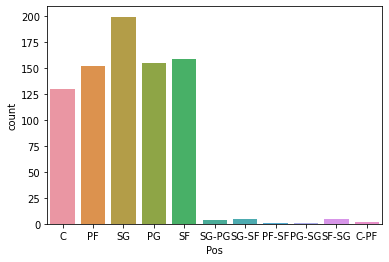

In [17]:
#positions and their count
sns.countplot(players['Pos'],label="Count")
plt.show()

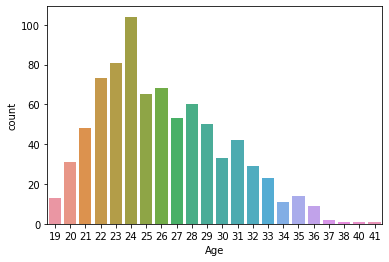

In [18]:
#age and count
sns.countplot(players['Age'],label="Count")
plt.show()

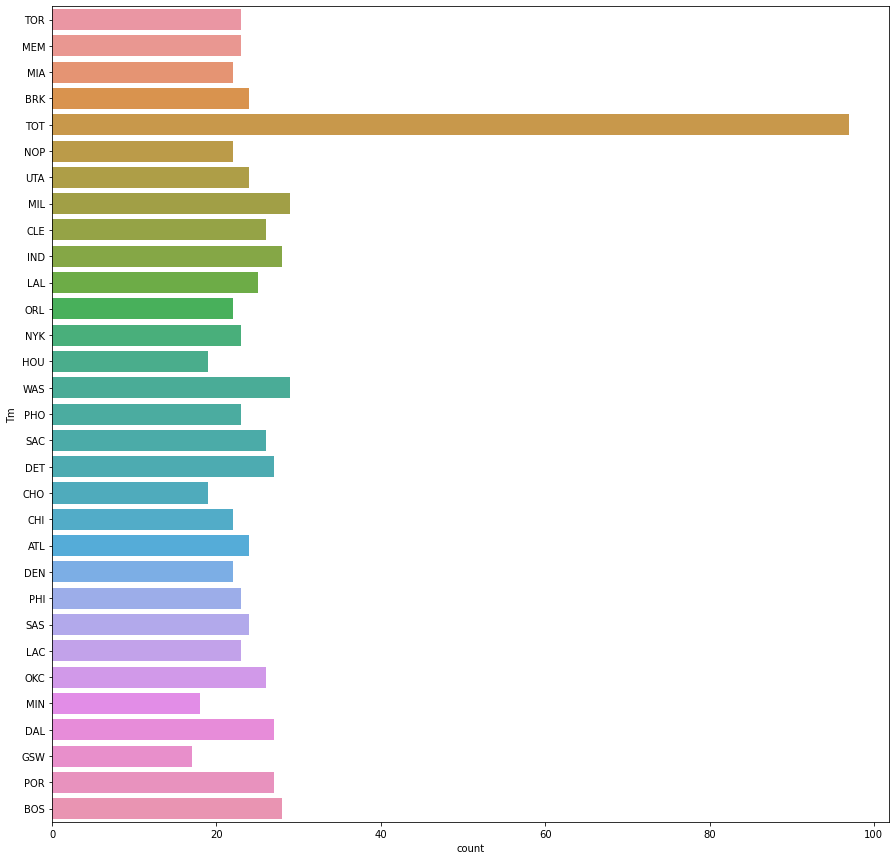

In [100]:
plt.figure(figsize = (15,15))
sns.countplot(y=players['Tm'],label="Count")
plt.show()

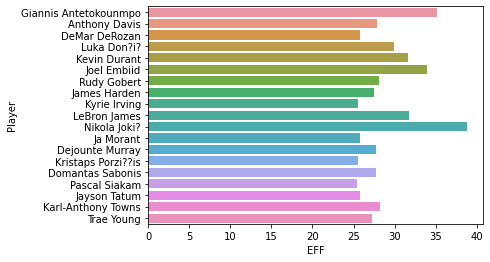

In [34]:
#players against efficiency top 20 players according to efficiency 33333
p = sns.barplot(x="EFF", y="Player", data=players[players.EFF>25], ci=None)



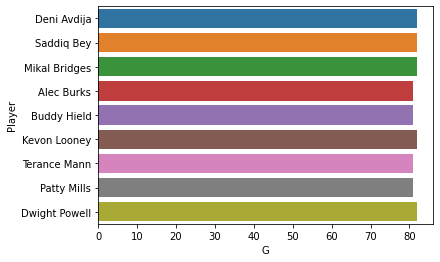

In [93]:
#players against games playesd
p = sns.barplot(x="G", y="Player", data=players[players.G>80], ci=None)

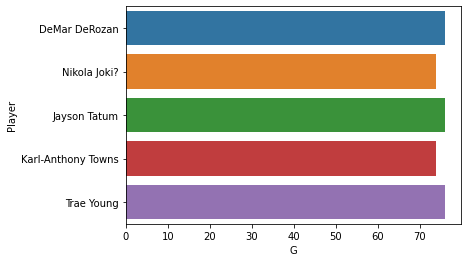

In [107]:
#players against games playesd and most points
#pointgame = players[(players['G']>75) &(players['Age']>33)]
p = sns.barplot(x="G", y="Player", data=players[(players.G>70)&(players['EFF']>25)], ci=None)

## Identifying players in their prime

In [241]:
#players in prime
prime=players[(players['EFF']>25) &(players['Age']>=19)]['Player']
prime.drop_duplicates()
#primetop20 =prime.drop_duplicates()
#primetop20


Rk
12     Giannis Antetokounmpo
127            Anthony Davis
134            DeMar DeRozan
141              Luka Don?i?
154             Kevin Durant
162              Joel Embiid
195              Rudy Gobert
218             James Harden
266             Kyrie Irving
274             LeBron James
290             Nikola Joki?
390                Ja Morant
400          Dejounte Murray
455       Kristaps Porzi??is
488         Domantas Sabonis
501            Pascal Siakam
526             Jayson Tatum
546       Karl-Anthony Towns
602               Trae Young
Name: Player, dtype: object

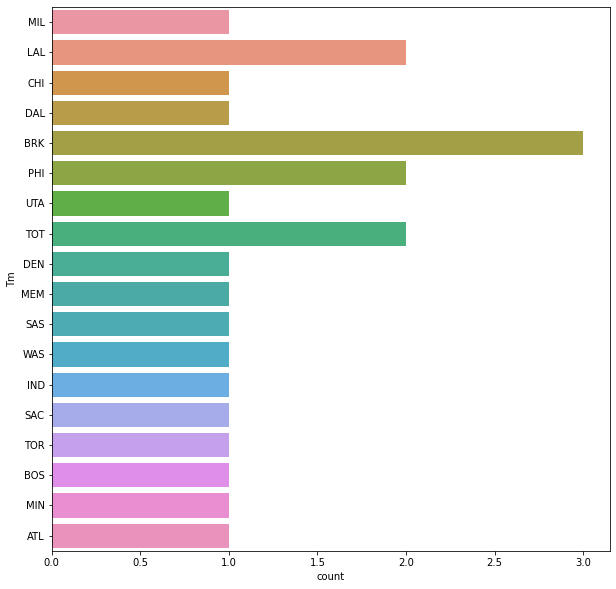

In [180]:
plt.figure(figsize = (10,10))
sns.countplot(y=primetop20['Tm'],label="Prime players")
plt.show()

## Narrowing Down to get the top 5 Prime Players

In [136]:
primespider=players[(players['EFF']>30) &(players['Age']>=19)]#['Player']
primespider

,Player,Pos,Age,Tm,G,GS,MP,FG,FGA,FG%,3P,3PA,3P%,2P,2PA,2P%,eFG%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,EFF
Rk,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
12,Giannis Antetokounmpo,PF,27,MIL,67,67,32.9,10.3,18.6,0.553,1.1,3.6,0.293,9.2,15.0,0.616,0.582,8.3,11.4,0.722,2.0,9.6,11.6,5.8,1.1,1.4,3.3,3.2,29.9,35.1
154,Kevin Durant,PF,33,BRK,55,55,37.2,10.5,20.3,0.518,2.1,5.5,0.383,8.4,14.8,0.568,0.570,6.8,7.4,0.910,0.5,6.9,7.4,6.4,0.9,0.9,3.5,2.1,29.9,31.6
162,Joel Embiid,C,27,PHI,68,68,33.8,9.8,19.6,0.499,1.4,3.7,0.371,8.4,15.9,0.529,0.534,9.6,11.8,0.814,2.1,9.6,11.7,4.2,1.1,1.5,3.1,2.7,30.6,34.0
274,LeBron James,SF,37,LAL,56,56,37.2,11.4,21.8,0.524,2.9,8.0,0.359,8.6,13.8,0.620,0.590,4.5,6.0,0.756,1.1,7.1,8.2,6.2,1.3,1.1,3.5,2.2,30.3,31.7
290,Nikola Joki?,C,26,DEN,74,74,33.5,10.3,17.7,0.583,1.3,3.9,0.337,9.0,13.8,0.652,0.620,5.1,6.3,0.810,2.8,11.0,13.8,7.9,1.5,0.9,3.8,2.6,27.1,38.8


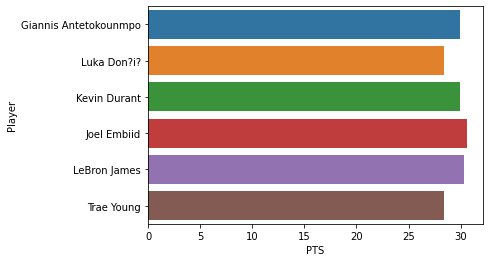

In [193]:
topfive3s=players[(players['PTS']>28)]
topfive3s
s3s = sns.barplot(x="PTS", y="Player", data=topfive3s, ci=None)

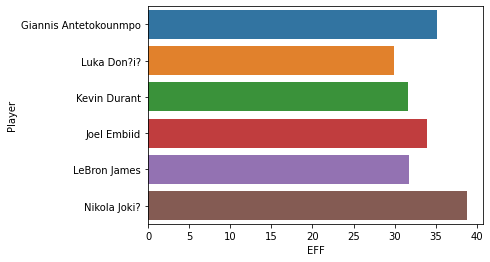

In [195]:
topfiveeffs=players[(players['EFF']>29)]
topfiveeffs
effs = sns.barplot(x="EFF", y="Player", data=topfiveeffs, ci=None)

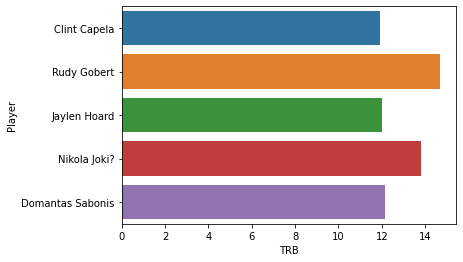

In [208]:
topfiveTRBS=players[(players['TRB']>11.7)]
topfiveTRBS
TRB = sns.barplot(x="TRB", y="Player", data=topfiveTRBS, ci=None)

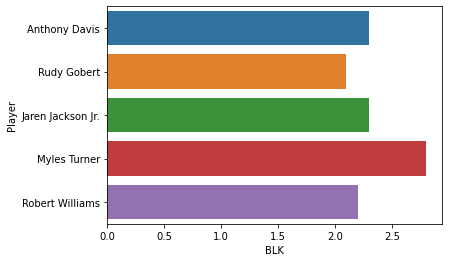

In [216]:
topfiveBLKS=players[(players['BLK']>1.8)]
topfiveBLKS
BLK = sns.barplot(x="BLK", y="Player", data=topfiveBLKS, ci=None)

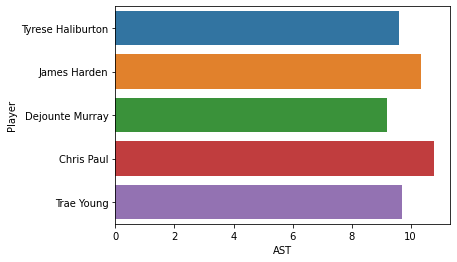

In [221]:
topfiveASTS=players[(players['AST']>9)]
topfiveASTS
AST = sns.barplot(x="AST", y="Player", data=topfiveASTS, ci=None)

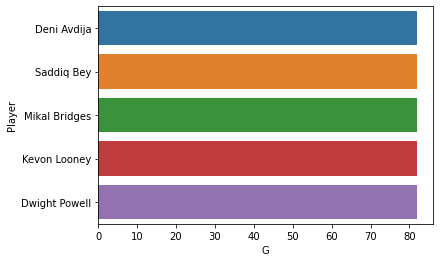

In [227]:
topfiveGS=players[(players['G']>81)]
topfiveGS
GS = sns.barplot(x="G", y="Player", data=topfiveGS, ci=None)

In [228]:
topfiveGS['Tm']

Rk
20     WAS
47     DET
66     PHO
335    GSW
457    DAL
Name: Tm, dtype: object

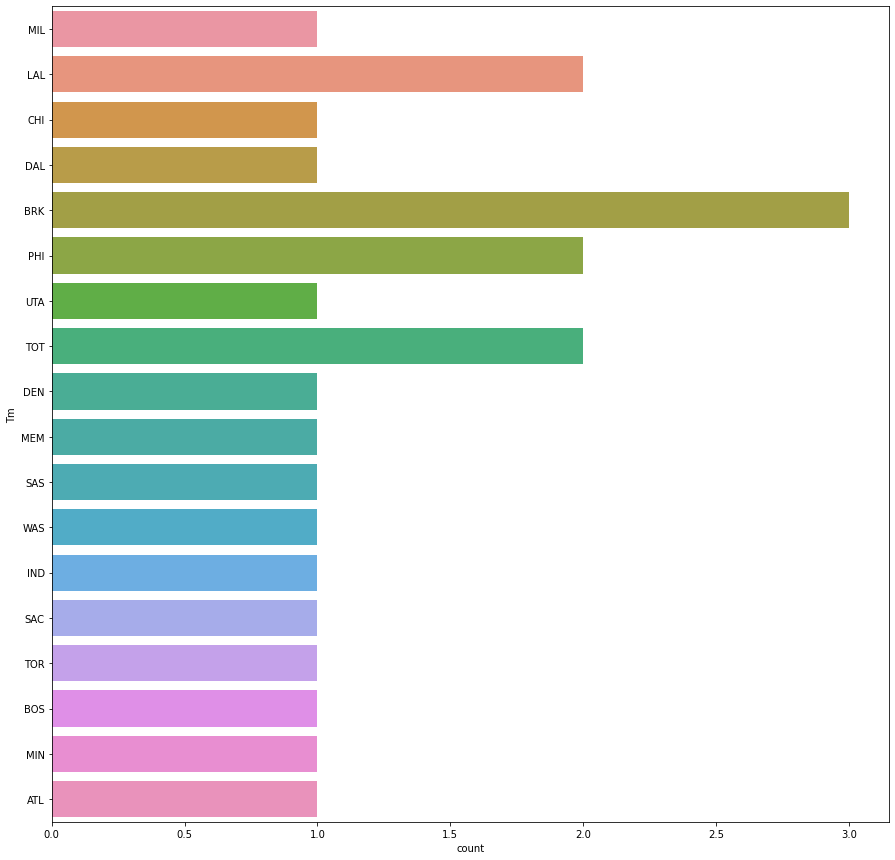

In [129]:
#prime teams
plt.figure(figsize = (15,15))
sns.countplot(y=primetop20['Tm'],label="Prime players")
plt.show()

In [238]:
primetop20['Player']

Rk
12     Giannis Antetokounmpo
127            Anthony Davis
134            DeMar DeRozan
141              Luka Don?i?
154             Kevin Durant
162              Joel Embiid
195              Rudy Gobert
218             James Harden
218             James Harden
218             James Harden
266             Kyrie Irving
274             LeBron James
290             Nikola Joki?
390                Ja Morant
400          Dejounte Murray
455       Kristaps Porzi??is
488         Domantas Sabonis
488         Domantas Sabonis
488         Domantas Sabonis
501            Pascal Siakam
526             Jayson Tatum
546       Karl-Anthony Towns
602               Trae Young
Name: Player, dtype: object

In [66]:
ff= players[players["Player"] =="LeBron James"]
ff
#print(players.Player['LeBron James'])
#titanic[titanic["Age"] > 35]

,Player,Pos,Age,Tm,G,GS,MP,FG,FGA,FG%,3P,3PA,3P%,2P,2PA,2P%,eFG%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,EFF
Rk,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
274,LeBron James,SF,37,LAL,56,56,37.2,11.4,21.8,0.524,2.9,8.0,0.359,8.6,13.8,0.62,0.59,4.5,6.0,0.756,1.1,7.1,8.2,6.2,1.3,1.1,3.5,2.2,30.3,31.7


In [185]:
SC= players[players["Player"] =="Stephen Curry"]
SC

,Player,Pos,Age,Tm,G,GS,MP,FG,FGA,FG%,3P,3PA,3P%,2P,2PA,2P%,eFG%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,EFF
Rk,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
126,Stephen Curry,PG,33,GSW,64,64,34.5,8.4,19.1,0.437,4.5,11.7,0.38,3.9,7.4,0.527,0.554,4.3,4.7,0.923,0.5,4.7,5.2,6.3,1.3,0.4,3.2,2.0,25.5,24.4


In [181]:
GGS= players[(players['G']==players['GS']) &(players['Age']>33)]['Player']
GGS

Rk
113     Mike Conley
250      Al Horford
274    LeBron James
340      Kyle Lowry
438      Chris Paul
Name: Player, dtype: object

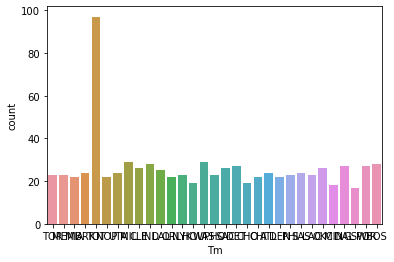

In [19]:
sns.countplot(players['Tm'],label="Count")
plt.show()

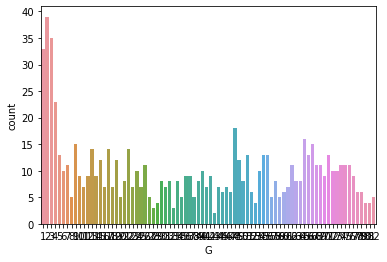

In [22]:
sns.countplot(players['G'],label="Count")
plt.show()

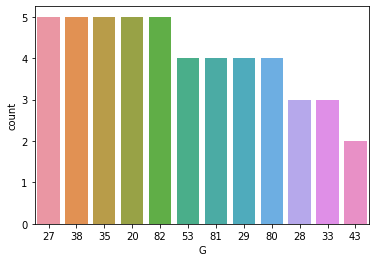

In [28]:
#Games played and count
sns.countplot(players['G'],label="Count", order=players.G.value_counts().iloc[70:].index)
plt.show()


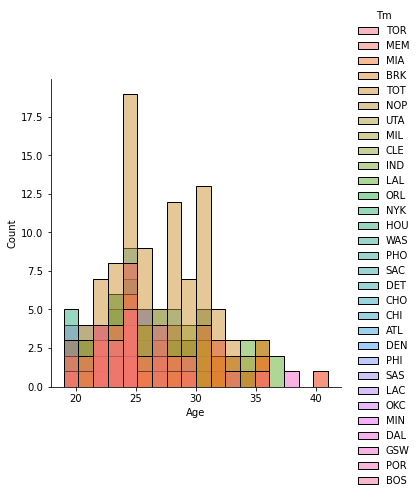

In [94]:
#age and which team they belong to
sns.displot(players, x="Age", hue="Tm", color='m')

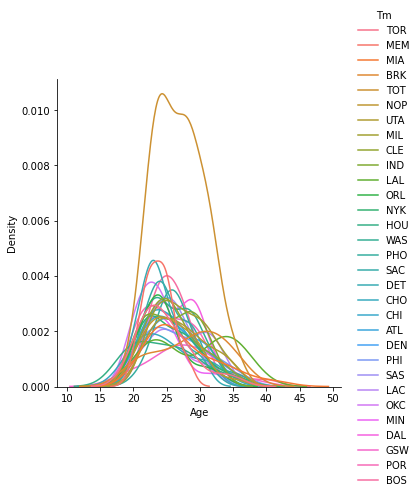

In [21]:
#age and team 
sns.displot(players, x="Age", hue="Tm", kind="kde")

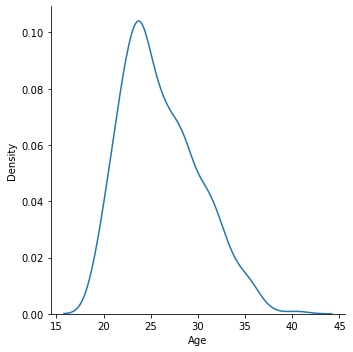

In [104]:
#age group preffered
sns.displot(players, x="Age", kind="kde")

<AxesSubplot:xlabel='Age', ylabel='PTS'>

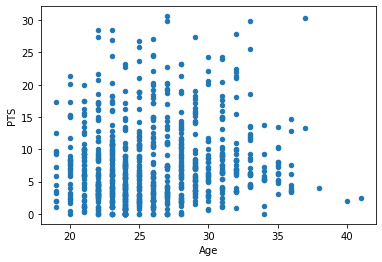

In [105]:
#age with points
players.plot(kind='scatter', x='Age', y='PTS')

<AxesSubplot:xlabel='Age', ylabel='AST'>

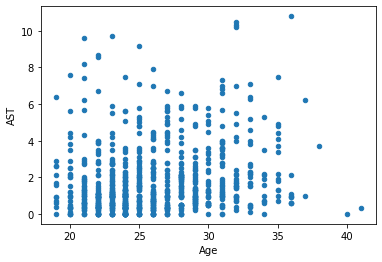

In [230]:
#age with points
players.plot(kind='scatter', x='Age', y='AST')

In [236]:
players[(players['Age']>35) & (players['AST'] > 10)]['Player']

Rk
438    Chris Paul
Name: Player, dtype: object

<AxesSubplot:xlabel='Pos', ylabel='PTS'>

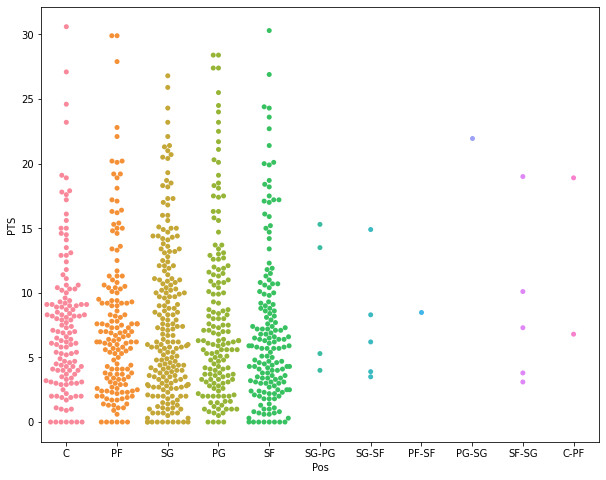

In [178]:
# points-position relation
plt.figure(figsize=(10,8))
sns.swarmplot(x=players["Pos"],
              y=players["PTS"])

<AxesSubplot:xlabel='Pos', ylabel='EFF'>

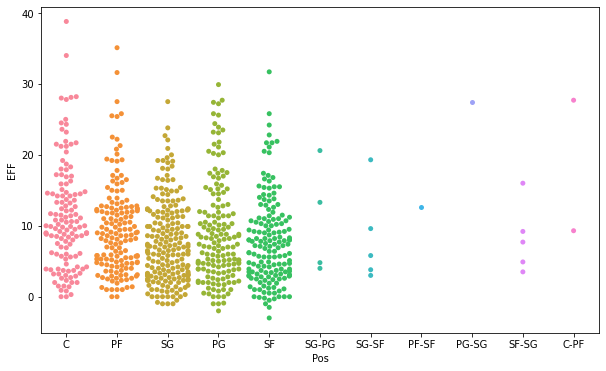

In [179]:
# efficiency-position relation
plt.figure(figsize=(10,6))
sns.swarmplot(x=players["Pos"],
              y=players["EFF"])

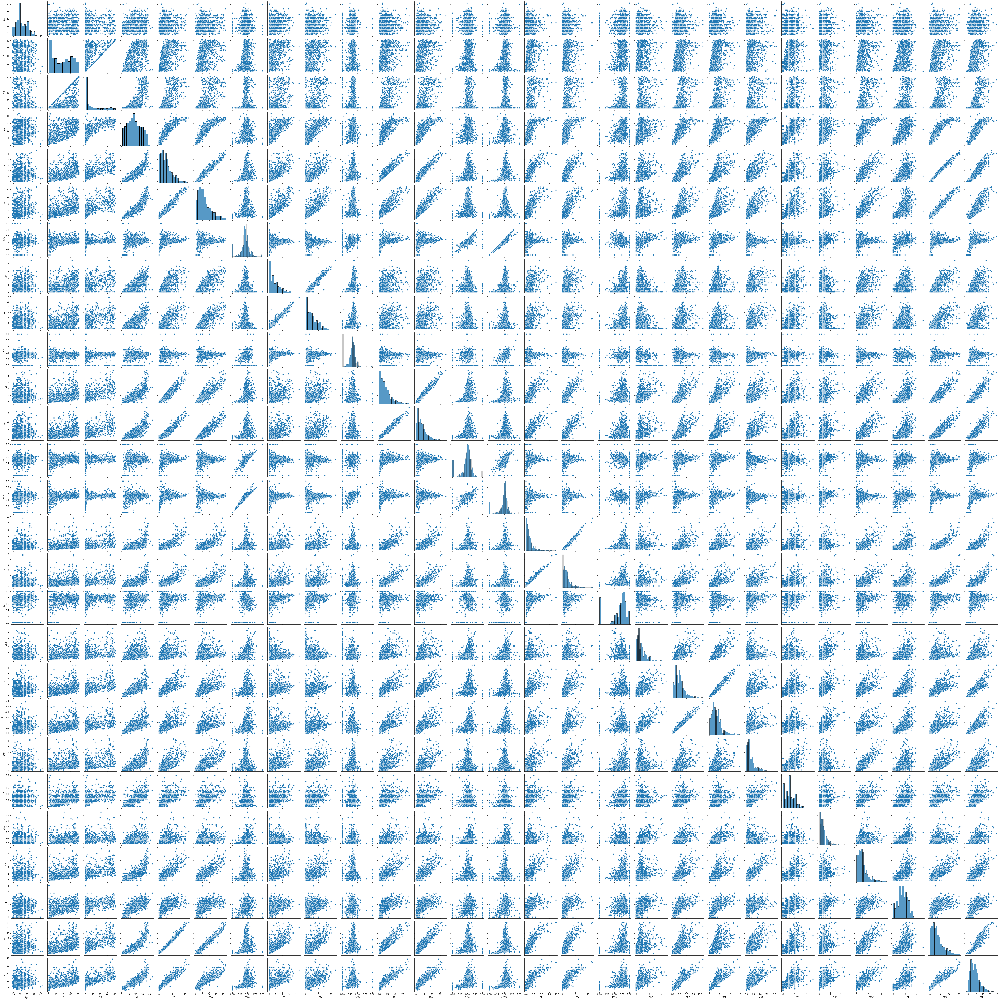

In [89]:
sns.pairplot(players)

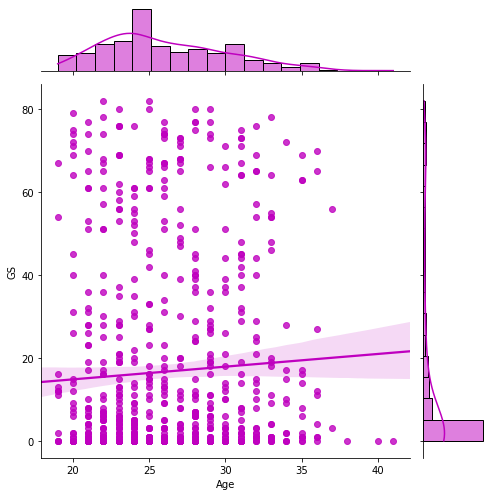

In [92]:
g = sns.jointplot(x="Age", y="GS", data=players,
                  kind="reg", truncate=False,
                  color="m", height=7) #xlim=(0, 60), ylim=(0, 12),

In [158]:
#primespider.drop(['Rk'],axis=1,inplace=False)
primespider
#scaleprimespider = primespider.copy()
#scaleprimespider.drop(['Player', 'Pos', 'Age', 'Tm', 'GS', 'MP', 'FG', 'FGA', 'FG%', '3P', '3PA', '3P%', '2P', '2PA', '2P%', 'eFG%', 'FT', 'FTA','FT%', 'ORB', 'DRB', 'STL', 'TOV', 'PF'], axis=1,inplace=True)
#scaleprimespider

,G,TRB,AST,BLK,PTS,EFF
Rk,,,,,,
12,67,11.6,5.8,1.4,29.9,35.1
154,55,7.4,6.4,0.9,29.9,31.6
162,68,11.7,4.2,1.5,30.6,34.0
274,56,8.2,6.2,1.1,30.3,31.7
290,74,13.8,7.9,0.9,27.1,38.8


# Sclaed the data and implemented in the spider plot 

## Giannis Antetokounmpo 
### Spider plot

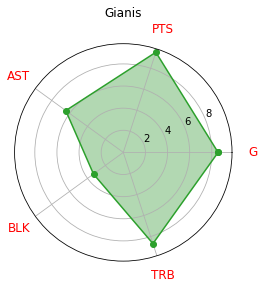

In [173]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

df = pd.DataFrame({'Col A': ['G', 'PTS', 'AST', 'BLK', 'TRB'],
                   'Col B': [8.57, 9.52, 6.43, 3.33, 8.67]})
fig = plt.figure()
ax = fig.add_subplot(111, projection="polar")

# theta has 5 different angles, and the first one repeated
theta = np.arange(len(df) + 1) / float(len(df)) * 2 * np.pi
# values has the 5 values from 'Col B', with the first element repeated
values = df['Col B'].values
values = np.append(values, values[0])

# draw the polygon and the mark the points for each angle/value combination
l1, = ax.plot(theta, values, color="C2", marker="o", label="Name of Col B")
plt.xticks(theta[:-1], df['Col A'], color='red', size=12)
ax.tick_params(pad=10) # to increase the distance of the labels to the plot
# fill the area of the polygon with green and some transparency
ax.fill(theta, values, 'green', alpha=0.3)

# plt.legend() # shows the legend, using the label of the line plot (useful when there is more than 1 polygon)
plt.title("Gianis")
plt.show()

## Kevin Durant	
### Spider plot

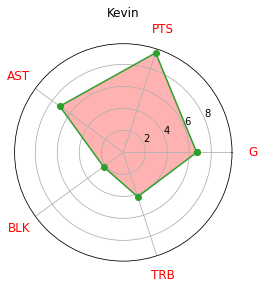

In [172]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

df = pd.DataFrame({'Col A': ['G', 'PTS', 'AST', 'BLK', 'TRB'],
                   'Col B': [6.67, 9.52, 7.14, 2.22, 4.24]})
fig = plt.figure()
ax = fig.add_subplot(111, projection="polar")

# theta has 5 different angles, and the first one repeated
theta = np.arange(len(df) + 1) / float(len(df)) * 2 * np.pi
# values has the 5 values from 'Col B', with the first element repeated
values = df['Col B'].values
values = np.append(values, values[0])

# draw the polygon and the mark the points for each angle/value combination
l1, = ax.plot(theta, values, color="C2", marker="o", label="Name of Col B")
plt.xticks(theta[:-1], df['Col A'], color='red', size=12)
ax.tick_params(pad=10) # to increase the distance of the labels to the plot
# fill the area of the polygon with green and some transparency
ax.fill(theta, values, 'red', alpha=0.3)

# plt.legend() # shows the legend, using the label of the line plot (useful when there is more than 1 polygon)
plt.title("Kevin")
plt.show()

## Joel embid
### Spider plot

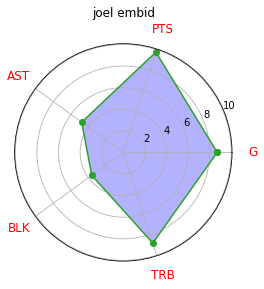

In [190]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

df = pd.DataFrame({'Col A': ['G', 'PTS', 'AST', 'BLK', 'TRB'],
                   'Col B': [8.70, 9.76, 4.76, 3.61, 8.83]})
fig = plt.figure()
ax = fig.add_subplot(111, projection="polar")

# theta has 5 different angles, and the first one repeated
theta = np.arange(len(df) + 1) / float(len(df)) * 2 * np.pi
# values has the 5 values from 'Col B', with the first element repeated
values = df['Col B'].values
values = np.append(values, values[0])

# draw the polygon and the mark the points for each angle/value combination
l1, = ax.plot(theta, values, color="C2", marker="o", label="Name of Col B")
plt.xticks(theta[:-1], df['Col A'], color='red', size=12)
ax.tick_params(pad=10) # to increase the distance of the labels to the plot
# fill the area of the polygon with green and some transparency
ax.fill(theta, values, 'blue', alpha=0.3)

# plt.legend() # shows the legend, using the label of the line plot (useful when there is more than 1 polygon)
plt.title("joel embid")
plt.show()

## LeBron James
### Spider plot

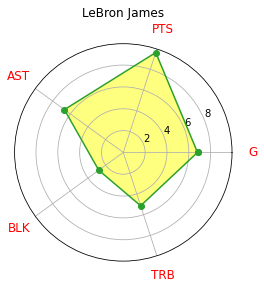

In [169]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

df = pd.DataFrame({'Col A': ['G', 'PTS', 'AST', 'BLK', 'TRB'],
                   'Col B': [6.80, 9.62, 6.67, 2.78, 5.14]})
fig = plt.figure()
ax = fig.add_subplot(111, projection="polar")

# theta has 5 different angles, and the first one repeated
theta = np.arange(len(df) + 1) / float(len(df)) * 2 * np.pi
# values has the 5 values from 'Col B', with the first element repeated
values = df['Col B'].values
values = np.append(values, values[0])

# draw the polygon and the mark the points for each angle/value combination
l1, = ax.plot(theta, values, color="C2", marker="o", label="Name of Col B")
plt.xticks(theta[:-1], df['Col A'], color='red', size=12)
ax.tick_params(pad=10) # to increase the distance of the labels to the plot
# fill the area of the polygon with green and some transparency
ax.fill(theta, values, 'yellow', alpha=0.5)

# plt.legend() # shows the legend, using the label of the line plot (useful when there is more than 1 polygon)
plt.title("LeBron James")
plt.show()

## Nikola Jokic 
### Spider plot

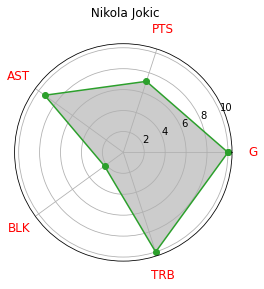

In [174]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

df = pd.DataFrame({'Col A': ['G', 'PTS', 'AST', 'BLK', 'TRB'],
                   'Col B': [10, 7.14, 9.29, 2.22, 10]})
fig = plt.figure()
ax = fig.add_subplot(111, projection="polar")

# theta has 5 different angles, and the first one repeated
theta = np.arange(len(df) + 1) / float(len(df)) * 2 * np.pi
# values has the 5 values from 'Col B', with the first element repeated
values = df['Col B'].values
values = np.append(values, values[0])

# draw the polygon and the mark the points for each angle/value combination
l1, = ax.plot(theta, values, color="C2", marker="o", label="Name of Col B")
plt.xticks(theta[:-1], df['Col A'], color='red', size=12)
ax.tick_params(pad=10) # to increase the distance of the labels to the plot
# fill the area of the polygon with green and some transparency
ax.fill(theta, values, 'black', alpha=0.2)

# plt.legend() # shows the legend, using the label of the line plot (useful when there is more than 1 polygon)
plt.title(" Nikola Jokic")
plt.show()